<a href="https://colab.research.google.com/github/pariscwang/understanding-neural-networks-in-finance/blob/main/Explainability_in_Neural_Networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Group Project: Giriraj Heda and Paris Wang

# Explainability in Neural Networks

### Import required libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

!pip install opendatasets

## installing specific version of Keras to resolve NoModuleFoundError
!pip install keras==2.12.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 11.9 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 2.12.0 which is incompatible.


### Directly import dataset from Kaggle using API

[This article shows how to create API on Kaggle to import datasets](https://https://www.geeksforgeeks.org/how-to-download-kaggle-datasets-into-jupyter-notebook/)

* Once the API is generated, use the Username and Key from the downloaded JSON file which is created after API is created
* When running the following cell, it will prompt to enter username and then key which will trigger the download

In [3]:
file =('/content/loan_approval_dataset.csv')
df = pd.read_csv(file)

df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [ ]:
print(df.shape, '\n')
df.info()

(4269, 13) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   loan_id                    4269 non-null   int64 
 1    no_of_dependents          4269 non-null   int64 
 2    education                 4269 non-null   object
 3    self_employed             4269 non-null   object
 4    income_annum              4269 non-null   int64 
 5    loan_amount               4269 non-null   int64 
 6    loan_term                 4269 non-null   int64 
 7    cibil_score               4269 non-null   int64 
 8    residential_assets_value  4269 non-null   int64 
 9    commercial_assets_value   4269 non-null   int64 
 10   luxury_assets_value       4269 non-null   int64 
 11   bank_asset_value          4269 non-null   int64 
 12   loan_status               4269 non-null   object
dtypes: int64(10), object(3)
memory usage: 433.7+ KB


In [ ]:
df.describe(include='all')

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
count,4269.000000,4269.000000,4269,4269,4.269000e+03,4.269000e+03,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4.269000e+03,4.269000e+03,4269
unique,NaN,NaN,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,NaN,NaN,Graduate,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Approved
freq,NaN,NaN,2144,2150,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2656
mean,2135.000000,2.498712,NaN,NaN,5.059124e+06,1.513345e+07,10.900445,599.936051,7.472617e+06,4.973155e+06,1.512631e+07,4.976692e+06,NaN
std,1232.498479,1.695910,NaN,NaN,2.806840e+06,9.043363e+06,5.709187,172.430401,6.503637e+06,4.388966e+06,9.103754e+06,3.250185e+06,NaN
min,1.000000,0.000000,NaN,NaN,2.000000e+05,3.000000e+05,2.000000,300.000000,-1.000000e+05,0.000000e+00,3.000000e+05,0.000000e+00,NaN
25%,1068.000000,1.000000,NaN,NaN,2.700000e+06,7.700000e+06,6.000000,453.000000,2.200000e+06,1.300000e+06,7.500000e+06,2.300000e+06,NaN
50%,2135.000000,3.000000,NaN,NaN,5.100000e+06,1.450000e+07,10.000000,600.000000,5.600000e+06,3.700000e+06,1.460000e+07,4.600000e+06,NaN
75%,3202.000000,4.000000,NaN,NaN,7.500000e+06,2.150000e+07,16.000000,748.000000,1.130000e+07,7.600000e+06,2.170000e+07,7.100000e+06,NaN


## Transforming dataset to improve data quality

#### Renaming column names to remove leading spaces

In [ ]:
df = df.rename(columns=lambda x: x.strip())
df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)
df.columns

Index(['loan_id', 'no_of_dependents', 'education', 'self_employed',
       'income_annum', 'loan_amount', 'loan_term', 'cibil_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'loan_status'],
      dtype='object')

In [ ]:
df = df.rename(columns={'cibil_score': 'credit_score'})
df.columns

Index(['loan_id', 'no_of_dependents', 'education', 'self_employed',
       'income_annum', 'loan_amount', 'loan_term', 'credit_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'loan_status'],
      dtype='object')

#### Converting amounts from INR to CAD (assuming currency exchange rate 1 CAD = 60 INR)

In [ ]:
df['income_annum'] = round(df['income_annum']/60, 2)
df['loan_amount'] = round(df['loan_amount']/60, 2)
df['residential_assets_value'] = round(df['residential_assets_value']/60, 2)
df['commercial_assets_value'] = round(df['commercial_assets_value']/60, 2)
df['luxury_assets_value'] = round(df['luxury_assets_value']/60, 2)
df['bank_asset_value'] = round(df['bank_asset_value']/60, 2)

In [ ]:
df['total_asset_value'] = df['residential_assets_value'] + df['commercial_assets_value'] + df['luxury_assets_value'] + df['bank_asset_value']

In [ ]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,credit_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,total_asset_value
0,1,2,Graduate,No,160000.00,498333.33,12,778,40000.00,293333.33,378333.33,133333.33,Approved,844999.99
1,2,0,Not Graduate,Yes,68333.33,203333.33,8,417,45000.00,36666.67,146666.67,55000.00,Rejected,283333.34
2,3,3,Graduate,No,151666.67,495000.00,20,506,118333.33,75000.00,555000.00,213333.33,Rejected,961666.66
3,4,3,Graduate,No,136666.67,511666.67,8,467,303333.33,55000.00,388333.33,131666.67,Rejected,878333.33
4,5,5,Not Graduate,Yes,163333.33,403333.33,20,382,206666.67,136666.67,490000.00,83333.33,Rejected,916666.67


## Exploratory Data Analysis

#### Value Counts

In [ ]:
exception_list = ['no_of_dependents', 'education', 'self_employed', 'loan_term', 'loan_status']
for x in df.columns:
  if x in exception_list:
    print(f'"column: {x}"')
    print(df[x].value_counts())
    print('-'*40, '\n')

"column: no_of_dependents"
4    752
3    727
0    712
2    708
1    697
5    673
Name: no_of_dependents, dtype: int64
---------------------------------------- 

"column: education"
Graduate        2144
Not Graduate    2125
Name: education, dtype: int64
---------------------------------------- 

"column: self_employed"
Yes    2150
No     2119
Name: self_employed, dtype: int64
---------------------------------------- 

"column: loan_term"
6     490
12    456
4     447
10    436
18    422
16    412
20    411
14    405
2     404
8     386
Name: loan_term, dtype: int64
---------------------------------------- 

"column: loan_status"
Approved    2656
Rejected    1613
Name: loan_status, dtype: int64
---------------------------------------- 



#### Data re-formatting for modelling purpose

Not using one-hot encoding here because there are only 2 unique values in the following columns

In [ ]:
df['loanstatus'] = df['loan_status'].replace({'Approved':1, 'Rejected':0})
df['edu'] = df['education'].replace({'Graduate':1, 'Not Graduate':0})
df['self_employ'] = df['self_employed'].replace({'Yes':1, 'No':0})

df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,credit_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,total_asset_value,loanstatus,edu,self_employ
0,1,2,Graduate,No,160000.00,498333.33,12,778,40000.00,293333.33,378333.33,133333.33,Approved,844999.99,1,1,0
1,2,0,Not Graduate,Yes,68333.33,203333.33,8,417,45000.00,36666.67,146666.67,55000.00,Rejected,283333.34,0,0,1
2,3,3,Graduate,No,151666.67,495000.00,20,506,118333.33,75000.00,555000.00,213333.33,Rejected,961666.66,0,1,0
3,4,3,Graduate,No,136666.67,511666.67,8,467,303333.33,55000.00,388333.33,131666.67,Rejected,878333.33,0,1,0
4,5,5,Not Graduate,Yes,163333.33,403333.33,20,382,206666.67,136666.67,490000.00,83333.33,Rejected,916666.67,0,0,1


#### Data Distribution Plot

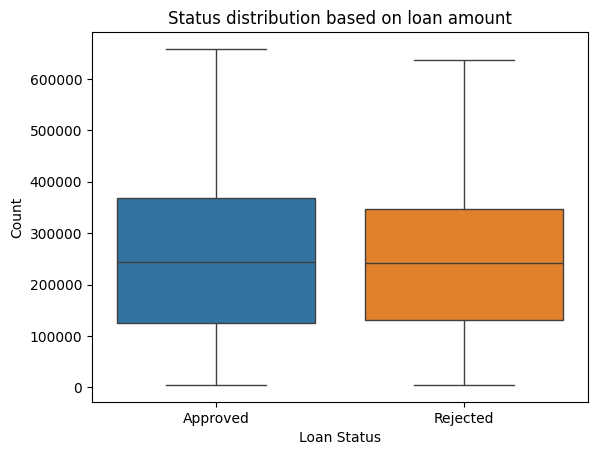

In [ ]:
sns.boxplot(data=df, x='loan_status', y='loan_amount', hue='loan_status')
plt.title("Status distribution based on loan amount")
plt.xlabel("Loan Status")
plt.ylabel("Count")
plt.show()

Text(37.722222222222214, 0.5, 'Loan Amount')

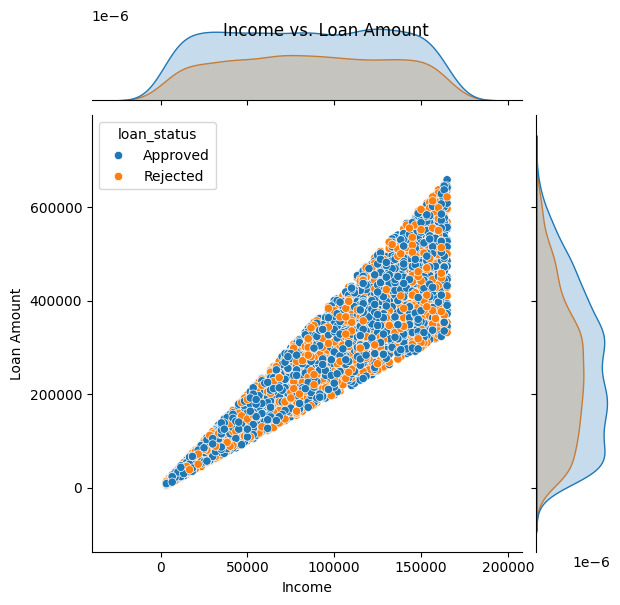

In [ ]:
sns.jointplot(data=df, x='income_annum', y='loan_amount', kind='scatter', hue='loan_status')
plt.suptitle("Income vs. Loan Amount")
plt.xlabel("Income")
plt.ylabel("Loan Amount")

Text(37.722222222222214, 0.5, 'Loan Amount')

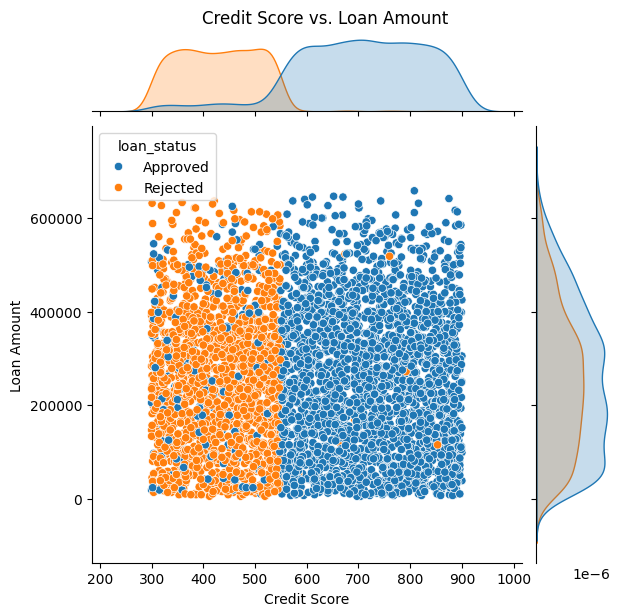

In [ ]:
sns.jointplot(data=df, x='credit_score', y='loan_amount', kind='scatter', hue='loan_status')
plt.suptitle("Credit Score vs. Loan Amount", y=1.02)
plt.xlabel("Credit Score")
plt.ylabel("Loan Amount")

<ipython-input-16-a5f033fa2d28>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_mat = df.corr()


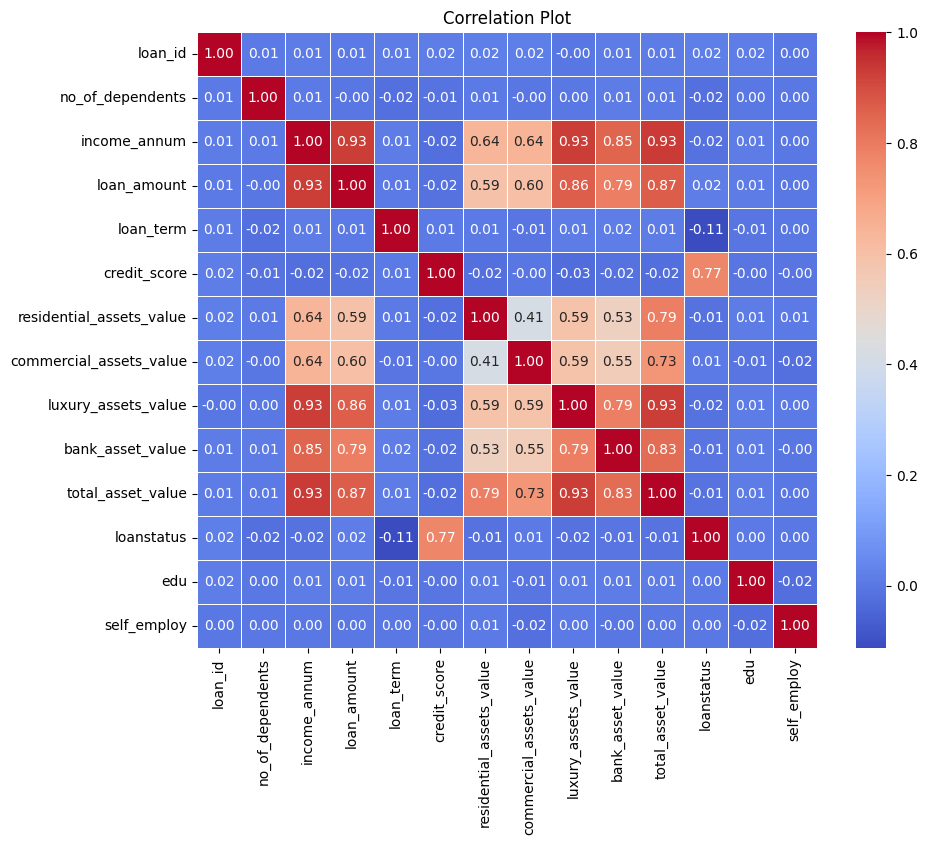

In [ ]:
corr_mat = df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_mat, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Plot')
plt.show()

### STATS Table

In [ ]:
stats = pd.crosstab(index=df['loan_term'], columns=df['loan_status'])
stats['total_appl'] = stats['Approved'] + stats['Rejected']
stats['approved%'] = ((stats['Approved']/stats['total_appl'])*100).round(2)
stats['rejected%'] = ((stats['Rejected']/stats['total_appl'])*100).round(2)

stats

loan_status,Approved,Rejected,total_appl,approved%,rejected%
loan_term,,,,,
2,315,89,404,77.97,22.03
4,366,81,447,81.88,18.12
6,282,208,490,57.55,42.45
8,220,166,386,56.99,43.01
10,229,207,436,52.52,47.48
12,276,180,456,60.53,39.47
14,239,166,405,59.01,40.99
16,236,176,412,57.28,42.72
18,257,165,422,60.90,39.10


## Modelling

#### Selecting features for modelling based on heatmap

In [ ]:
df.columns

Index(['loan_id', 'no_of_dependents', 'education', 'self_employed',
       'income_annum', 'loan_amount', 'loan_term', 'credit_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'loan_status',
       'total_asset_value', 'loanstatus', 'edu', 'self_employ'],
      dtype='object')

In [ ]:
df_mod = df[['income_annum', 'loan_amount', 'loan_term', 'credit_score', 'total_asset_value', 'loanstatus']].copy()
df_mod.head()

,income_annum,loan_amount,loan_term,credit_score,total_asset_value,loanstatus
0,160000.00,498333.33,12,778,844999.99,1
1,68333.33,203333.33,8,417,283333.34,0
2,151666.67,495000.00,20,506,961666.66,0
3,136666.67,511666.67,8,467,878333.33,0
4,163333.33,403333.33,20,382,916666.67,0


In [ ]:
df_mod.loanstatus.value_counts()

1    2656
0    1613
Name: loanstatus, dtype: int64

##### Import libraries for creating neural network
* Using Keras Classifier to perform classification on loan status

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from keras.models import Sequential, load_model
from keras.layers import Dense
from keras.optimizers import Adam
from keras.wrappers.scikit_learn import KerasClassifier
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

import pickle

In [ ]:
x_train, x_temp, y_train, y_temp = train_test_split(df_mod.drop('loanstatus', axis=1), df_mod['loanstatus'], test_size=0.3, random_state=1, stratify=df_mod['loanstatus'])
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp)

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape, x_test.shape, y_test.shape

((2988, 5), (2988,), (640, 5), (640,), (641, 5), (641,))

#### Scaling Features with mean=0 and std=1

In [ ]:
stand_scaler = StandardScaler()
stand_scaler.fit(x_train)
x_train_stand = pd.DataFrame(stand_scaler.transform(x_train), columns=x_train.columns)
x_val_stand = pd.DataFrame(stand_scaler.transform(x_val), columns=x_val.columns)
x_test_stand = pd.DataFrame(stand_scaler.transform(x_test), columns=x_test.columns)

#### Running an Opaque model - Neural Network (KerasClassifier)

In [ ]:
def create_model(optimizer='adam', reg=0.01):
  model = Sequential()
  model.add(Dense(64, input_dim=5, activation='relu', kernel_regularizer=l2(reg)))
  model.add(Dense(32, activation='relu', kernel_regularizer=l2(reg)))
  model.add(Dense(1, activation='sigmoid'))
  model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
  return model

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

#### Hyper-parameter Tuning using GridSerachCV

In [ ]:
## commeting this cell to avoid running as we have generated .pkl file to load the best params
## running this cells takes around 15-20 mins to complete

# model = KerasClassifier(build_fn=create_model, verbose=1)
# param_grid = {'optimizer': ['adam', 'sgd'], 'batch_size': [16, 32], 'epochs': [50, 100], 'reg': [0.01, 0.001]}
# grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)
# grid_result = grid.fit(x_train_stand, y_train, validation_data=(x_val_stand, y_val), callbacks=[early_stopping])

In [ ]:
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

#### Saving the best parameters for future use

In [ ]:
# best_params = grid_result.best_params_
# with open('best_params.pkl', 'wb') as file:
#   pickle.dump(best_params, file)

#### Loading the pickle file to load the best params

In [ ]:
with open('best_params.pkl', 'rb') as file:
  best_params = pickle.load(file)
  print(f'best optimizer: ', best_params['optimizer'])
  print(f'best no of epochs: ', best_params['epochs'])
  print(f'best best size: ', best_params['batch_size'])
  print(f'best learning rate: ', best_params['reg'])

best optimizer:  adam
best no of epochs:  100
best best size:  16
best learning rate:  0.001


#### Training the model with best params

In [ ]:
best_model = create_model(optimizer=best_params['optimizer'], reg=best_params['reg'])
history = best_model.fit(x_train_stand, y_train, epochs=best_params['epochs'],
                         batch_size=best_params['batch_size'], validation_data=(x_val_stand, y_val), verbose=1)

Epoch 1/100
187/187 [==============================] - 2s 6ms/step - loss: 0.3675 - accuracy: 0.8906 - val_loss: 0.2385 - val_accuracy: 0.9328
Epoch 2/100
187/187 [==============================] - 1s 3ms/step - loss: 0.2335 - accuracy: 0.9337 - val_loss: 0.1980 - val_accuracy: 0.9453
Epoch 3/100
187/187 [==============================] - 1s 4ms/step - loss: 0.2073 - accuracy: 0.9434 - val_loss: 0.1796 - val_accuracy: 0.9516
Epoch 4/100
187/187 [==============================] - 1s 4ms/step - loss: 0.1921 - accuracy: 0.9501 - val_loss: 0.1667 - val_accuracy: 0.9594
Epoch 5/100
187/187 [==============================] - 1s 4ms/step - loss: 0.1792 - accuracy: 0.9518 - val_loss: 0.1520 - val_accuracy: 0.9625
Epoch 6/100
187/187 [==============================] - 1s 4ms/step - loss: 0.1685 - accuracy: 0.9582 - val_loss: 0.1466 - val_accuracy: 0.9609
Epoch 7/100
187/187 [==============================] - 1s 3ms/step - loss: 0.1592 - accuracy: 0.9618 - val_loss: 0.1401 - val_accuracy: 0.9641

#### Evaluation

In [ ]:
y_pred = best_model.predict(x_test_stand)
y_pred = (y_pred > 0.5)

print(f'\nAccuracy: ', round(accuracy_score(y_test, y_pred), 4))
print(f"Classification Report: ", classification_report(y_test, y_pred))
conf_mat = confusion_matrix(y_test, y_pred)

21/21 [==============================] - 0s 2ms/step

Accuracy:  0.9875
Classification Report:                precision    recall  f1-score   support

           0       1.00      0.97      0.98       242
           1       0.98      1.00      0.99       399

    accuracy                           0.99       641
   macro avg       0.99      0.98      0.99       641
weighted avg       0.99      0.99      0.99       641



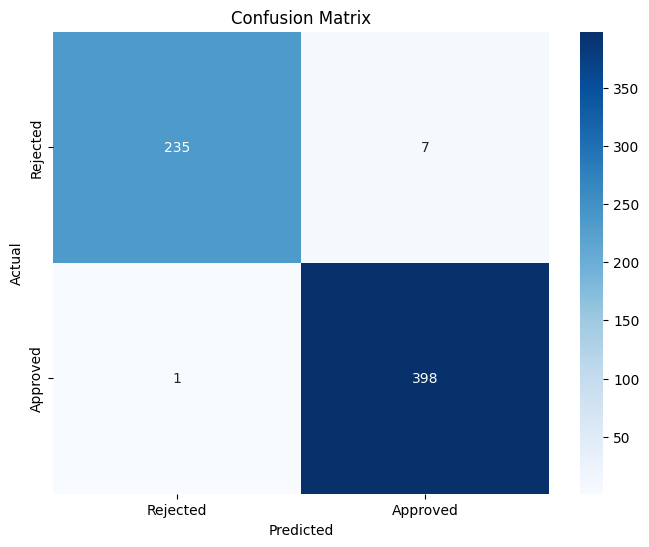

In [ ]:
plt.figure(figsize=(8,6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Rejected', 'Approved'], yticklabels=['Rejected', 'Approved'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Checking for overfitting

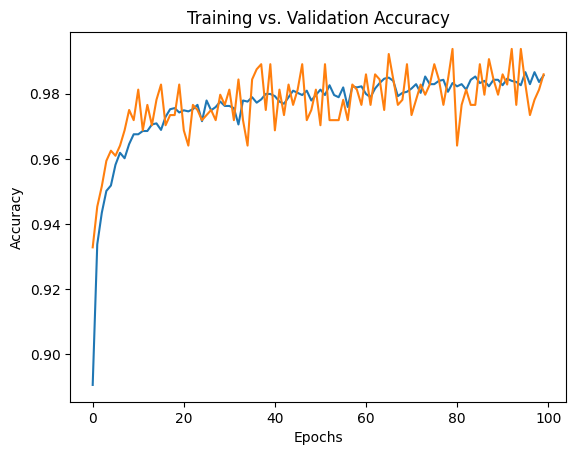

In [ ]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs. Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

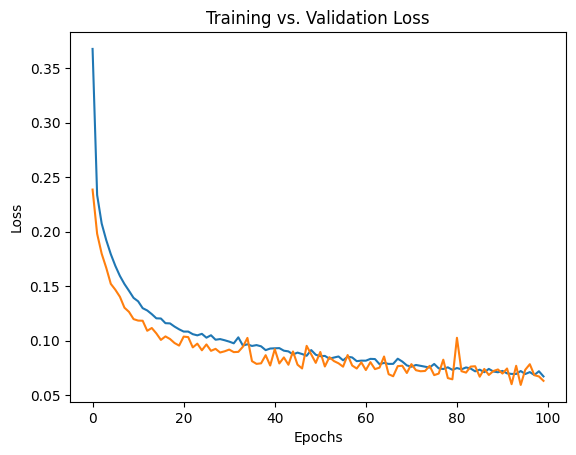

In [ ]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

# Explainability

In [ ]:
!pip install shap
!pip install lime
!pip install bokeh

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=61f1b383b0878a637d2b980ba3d3ab5ed45f1aba6ed392e277e9030ef2c5c25b
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import shap
import lime
import lime.lime_tabular

#### SHAP Feature Importance Plot

In [ ]:
explainer = shap.KernelExplainer(best_model.predict, data=x_train_stand.sample(n=20))
shap_values = explainer.shap_values(x_test_stand)

1/1 [==============================] - 0s 99ms/step


  0%|          | 0/641 [00:00<?, ?it/s]

19/19 [==============================] - 0s 2ms/step


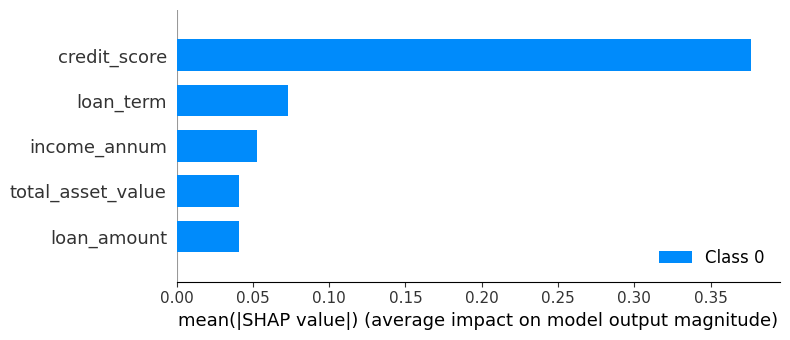

In [ ]:
shap.summary_plot(shap_values, x_test_stand, feature_names=x_test_stand.columns)

#### Combining SHAP and LIME

feature values-
 income_annum          38333.33
loan_amount          135000.00
loan_term                 2.00
credit_score            504.00
total_asset_value    210000.01
Name: 2935, dtype: float64 

target value: 1
predicted value: [1]


----------------------------------------------------------------------------------------------------
LIME
157/157 [==============================] - 0s 2ms/step



                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    




----------------------------------------------------------------------------------------------------
SHAP


19/19 [==============================] - 0s 2ms/step


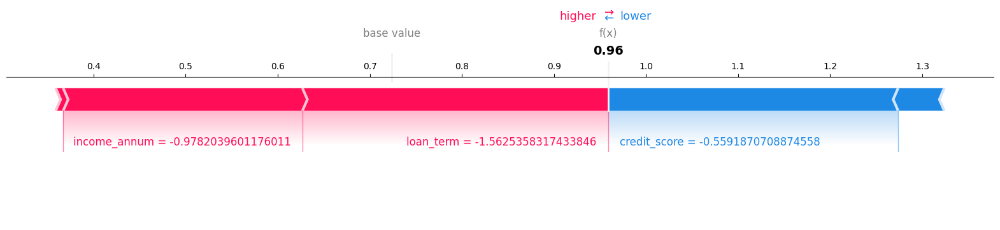

In [ ]:
val = 100

print('feature values-\n', x_test.iloc[val], '\n')
print('target value:', y_test.iloc[val])
print('predicted value:', (y_pred[val] > 0.5).astype(int))

print('\n')
print('-'*100)

print('LIME')
l_explainer = lime.lime_tabular.LimeTabularExplainer(x_train_stand.values, mode='classification', feature_names=x_train_stand.columns,
                                                     training_labels=y_train, class_names=['Rejected', 'Approved'])
l_explanation = l_explainer.explain_instance(x_test_stand.iloc[val], best_model.predict, num_features=5, top_labels=2)
l_explanation.show_in_notebook()

print('\n')
print('-'*100)

from bokeh.io import output_notebook
output_notebook()

print('SHAP')
shap.initjs()
instance_to_plot = x_test_stand.iloc[val]
shap_value_ins = explainer.shap_values(instance_to_plot)
shap.force_plot(explainer.expected_value[0], shap_value_ins[0], instance_to_plot, feature_names=x_test_stand.columns, matplotlib=True)

feature values-
 income_annum          78333.33
loan_amount          253333.33
loan_term                10.00
credit_score            786.00
total_asset_value    531666.66
Name: 2887, dtype: float64 

target value: 1
predicted value: [1]


----------------------------------------------------------------------------------------------------
LIME
157/157 [==============================] - 0s 2ms/step



                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    




----------------------------------------------------------------------------------------------------
SHAP


19/19 [==============================] - 0s 2ms/step


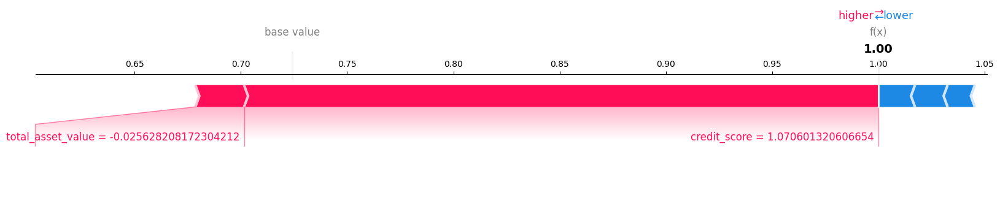

In [ ]:
val = 300

print('feature values-\n', x_test.iloc[val], '\n')
print('target value:', y_test.iloc[val])
print('predicted value:', (y_pred[val] > 0.5).astype(int))

print('\n')
print('-'*100)

print('LIME')
l_explainer = lime.lime_tabular.LimeTabularExplainer(x_train_stand.values, mode='classification', feature_names=x_train_stand.columns,
                                                     training_labels=y_train, class_names=['Rejected', 'Approved'])
l_explanation = l_explainer.explain_instance(x_test_stand.iloc[val], best_model.predict, num_features=5, top_labels=2)
l_explanation.show_in_notebook()

print('\n')
print('-'*100)

from bokeh.io import output_notebook
output_notebook()

print('SHAP')
shap.initjs()
instance_to_plot = x_test_stand.iloc[val]
shap_value_ins = explainer.shap_values(instance_to_plot)
shap.force_plot(explainer.expected_value[0], shap_value_ins[0], instance_to_plot, feature_names=x_test_stand.columns, matplotlib=True)

### Taking a look at False Positive and False Negative Cases

In [ ]:
y_pred_actual = (y_pred > 0.5).astype(int).flatten()
np.where(y_test != y_pred_actual)

(array([195, 247, 257, 379, 489, 532, 543, 562]),)

feature values-
 income_annum         116666.67
loan_amount          410000.00
loan_term                 6.00
credit_score            542.00
total_asset_value    636666.66
Name: 2159, dtype: float64 

target value: 0
predicted value: [1]


----------------------------------------------------------------------------------------------------
LIME
157/157 [==============================] - 1s 7ms/step



                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    




----------------------------------------------------------------------------------------------------
SHAP


19/19 [==============================] - 0s 10ms/step


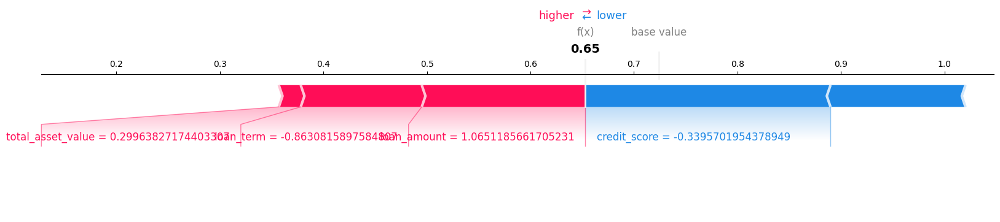

In [ ]:
val = 195

print('feature values-\n', x_test.iloc[val], '\n')
print('target value:', y_test.iloc[val])
print('predicted value:', (y_pred[val] > 0.5).astype(int))

print('\n')
print('-'*100)

print('LIME')
l_explainer = lime.lime_tabular.LimeTabularExplainer(x_train_stand.values, mode='classification', feature_names=x_train_stand.columns,
                                                     training_labels=y_train, class_names=['Rejected', 'Approved'])
l_explanation = l_explainer.explain_instance(x_test_stand.iloc[val], best_model.predict, num_features=5, top_labels=2)
l_explanation.show_in_notebook()

print('\n')
print('-'*100)

from bokeh.io import output_notebook
output_notebook()

print('SHAP')
shap.initjs()
instance_to_plot = x_test_stand.iloc[val]
shap_value_ins = explainer.shap_values(instance_to_plot)
shap.force_plot(explainer.expected_value[0], shap_value_ins[0], instance_to_plot, feature_names=x_test_stand.columns, matplotlib=True)

feature values-
 income_annum          45000.00
loan_amount          161666.67
loan_term                20.00
credit_score            551.00
total_asset_value    188333.34
Name: 3026, dtype: float64 

target value: 1
predicted value: [0]


----------------------------------------------------------------------------------------------------
LIME
157/157 [==============================] - 0s 3ms/step



                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    




----------------------------------------------------------------------------------------------------
SHAP


19/19 [==============================] - 0s 4ms/step


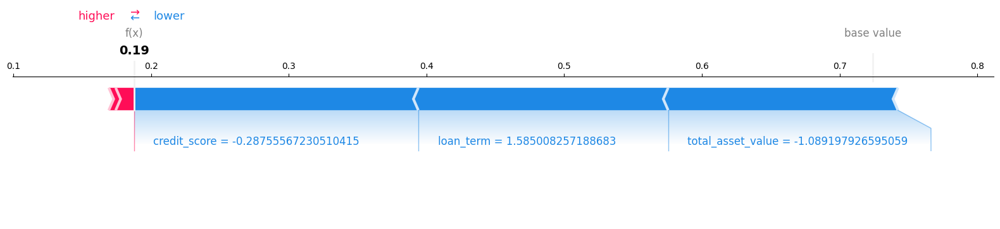

In [ ]:
val = 379

print('feature values-\n', x_test.iloc[val], '\n')
print('target value:', y_test.iloc[val])
print('predicted value:', (y_pred[val] > 0.5).astype(int))

print('\n')
print('-'*100)

print('LIME')
l_explainer = lime.lime_tabular.LimeTabularExplainer(x_train_stand.values, mode='classification', feature_names=x_train_stand.columns,
                                                     training_labels=y_train, class_names=['Rejected', 'Approved'])
l_explanation = l_explainer.explain_instance(x_test_stand.iloc[val], best_model.predict, num_features=5, top_labels=2)
l_explanation.show_in_notebook()

print('\n')
print('-'*100)

from bokeh.io import output_notebook
output_notebook()

print('SHAP')
shap.initjs()
instance_to_plot = x_test_stand.iloc[val]
shap_value_ins = explainer.shap_values(instance_to_plot)
shap.force_plot(explainer.expected_value[0], shap_value_ins[0], instance_to_plot, feature_names=x_test_stand.columns, matplotlib=True)

### Next Steps

### Synthetic Data
* creating manual data to identify ranges
* using code to randomly generate synthetic data based on identified range
* re-train the model coupled with synthetic data to see if the gaps have been bridged


### Incorporating Race into modelling
* randomly assigning race to data-points
* re-train the model to check whether the algorithm is based or not


#### Make use of Model Cards (Week 3 reading) for documentation and submission of report